# Further analysis of subgrid tendencies

In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.animation import FuncAnimation
import numpy as np
import scipy as sp
import xarray as xr
import IPython

import modules.parametrisation as param
from modules import stats


## Conditioning on $z$

In [3]:
fine_t = xr.open_mfdataset('../data/training/2048x256_t/*.nc')
fine_tplusdt = xr.open_mfdataset('../data/training/2048x256_tplusdt/*.nc')
fine_tend_filt = xr.open_dataset(
    '../data/training/2048x256_tend_256x64_lessfilt/2048x256_tend_256x64_lessfilt.nc')
coarse_t = xr.open_mfdataset(
    '../data/training/256x64_from_2048x256_lessfilt_t/*.nc')
coarse_tplusdt = xr.open_mfdataset(
    '../data/training/256x64_from_2048x256_lessfilt_tplusdt/*.nc')

fine_t = fine_t.isel(t=(fine_t.t < 299))
fine_tplusdt = fine_tplusdt.isel(t=(fine_tplusdt.t < 299))
coarse_t = coarse_t.isel(t=(coarse_t.t < 299))
coarse_tplusdt = coarse_tplusdt.isel(t=(coarse_tplusdt.t < 299))

fine_tend = param.tendency(fine_t, fine_tplusdt)
coarse_tend = param.tendency(coarse_t, coarse_tplusdt)
subgrid_tend = fine_tend_filt - coarse_tend


### $0 \leq z \leq 0.05$

In [6]:
rng = np.random.default_rng(seed=0)
x_sample = rng.uniform(0, 8, 256*32)
z_sample = rng.uniform(0, 0.05, 256*32)


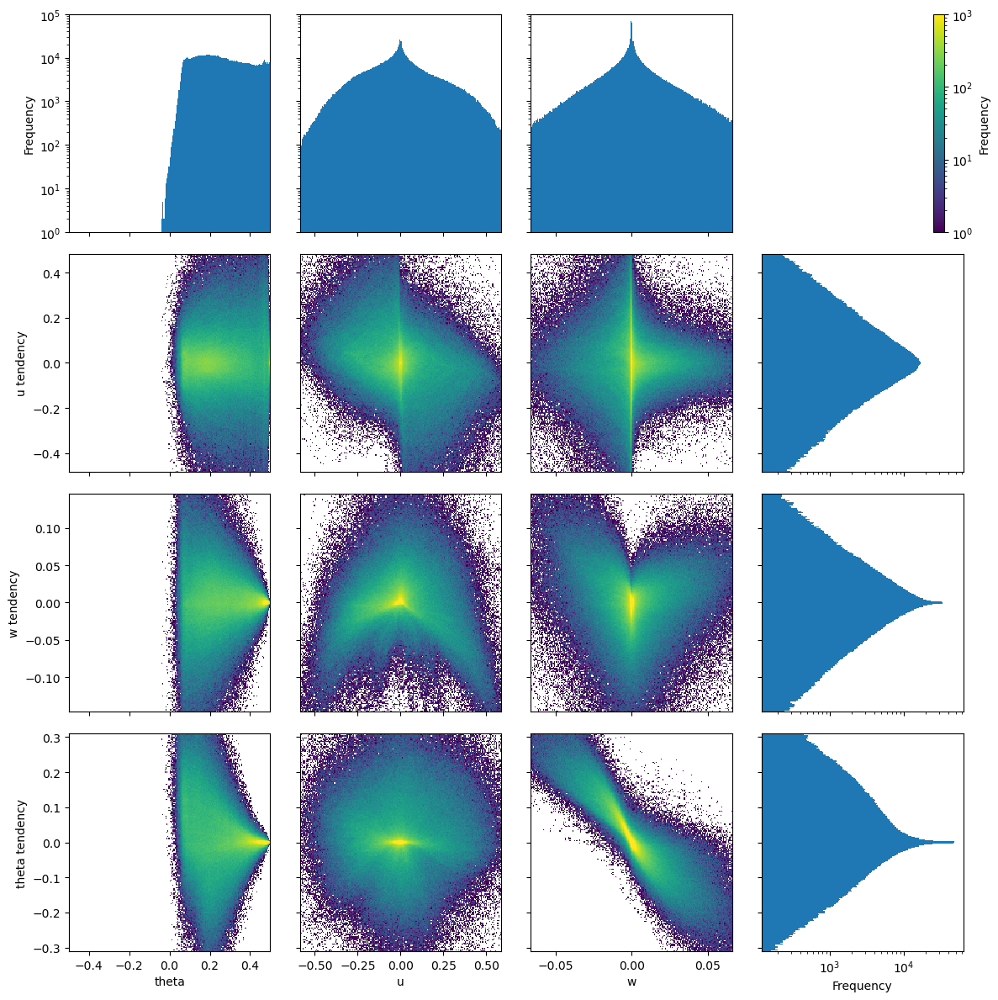

In [7]:
fig, axes = plt.subplots(4, 4, sharex='col', sharey='row', figsize=(12, 12))
hist1d_nbins = 200
hist2d_nbins = 200
n_std = 3

for i, tend_var in enumerate(subgrid_tend.data_vars):
    tend_data = param.sample(
        subgrid_tend[tend_var].compute(), x_sample, z_sample, 0, 0).ravel()
    tend_lim = n_std*tend_data.std()
    axes[i+1,0].set_ylabel(f'{tend_var} tendency')

    axes[i+1,3].hist(
        tend_data, bins=hist1d_nbins, orientation='horizontal',
        range=(-tend_lim, tend_lim), color='tab:blue',
        histtype='stepfilled', log=True
    )

    for j, state_var in enumerate(coarse_t.data_vars):
        state_data = param.sample(
            coarse_t[state_var].compute(), x_sample, z_sample,
            1/2 if state_var == 'theta' else 0,
            -1/2 if state_var == 'theta' else 0,
        ).ravel()
        if state_var == 'theta':
            state_lim = 0.5
        else:
            state_lim = n_std*state_data.std()

        _, _, _, hist = axes[i+1,j].hist2d(
            state_data, tend_data, bins=[hist2d_nbins, hist2d_nbins],
            range=[[-state_lim, state_lim], [-tend_lim, tend_lim]],
            norm='log', vmin=1, vmax=1e3
        )

        if i == 0:
            axes[0,j].hist(
                state_data, bins=hist1d_nbins,
                range=(-state_lim, state_lim), color='tab:blue',
                histtype='stepfilled', log=True
            )
            axes[0,j].set_ylim(1, 1e5)
            axes[-1,j].set_xlabel(state_var)

fig.colorbar(hist, ax=axes[0,-1], label='Frequency')
axes[0,0].set_ylabel('Frequency')
axes[-1,-1].set_xlabel('Frequency')
axes[0,3].remove()
fig.tight_layout()


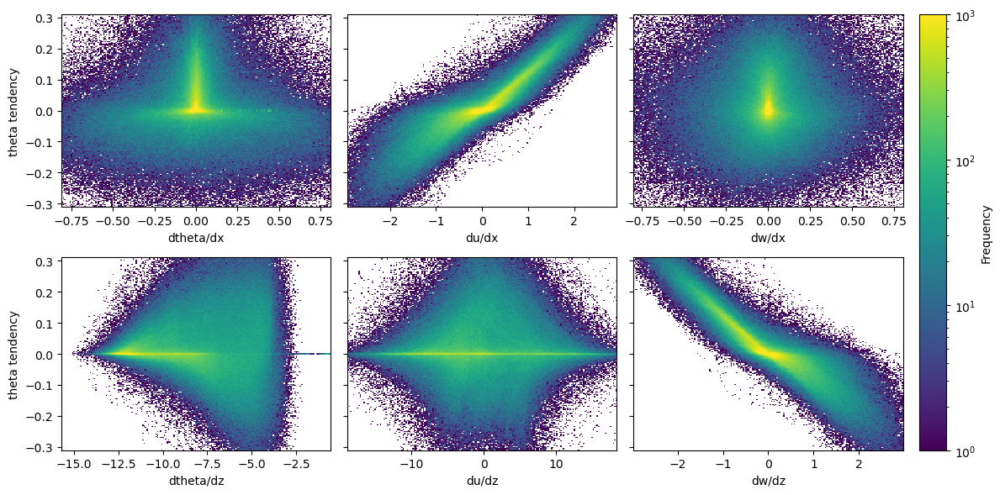

In [8]:
fig = plt.figure(figsize=(12, 6))
gs = mpl.gridspec.GridSpec(
    2, 4, height_ratios=[1, 1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

tend_var = 'theta'
tend_data = param.sample(
    subgrid_tend[tend_var].compute(), x_sample, z_sample, 0, 0).ravel()
tend_lim = n_std*tend_data.std()

for i, coord in enumerate(['x', 'z']):
    for j, state_var in enumerate(coarse_t.data_vars):
        state_data = param.sample(
            coarse_t[state_var].differentiate(coord).compute(),
            x_sample, z_sample,
            1/2 if state_var == 'theta' else 0,
            -1/2 if state_var == 'theta' else 0,
        ).ravel()
        state_lim = n_std*state_data.std()
        state_mean = state_data.mean()

        ax = fig.add_subplot(gs[i,j])
        _, _, _, hist = ax.hist2d(
            state_data, tend_data, bins=[hist2d_nbins, hist2d_nbins],
            range=[
                [state_mean - state_lim, state_mean + state_lim],
                [-tend_lim, tend_lim],
            ],
            norm='log', vmin=1, vmax=1e3,
        )

        ax.set_xlabel(f'd{state_var}/d{coord}')
        if j == 0:
            ax.set_ylabel(f'{tend_var} tendency')
        else:
            ax.set_yticklabels([])

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()


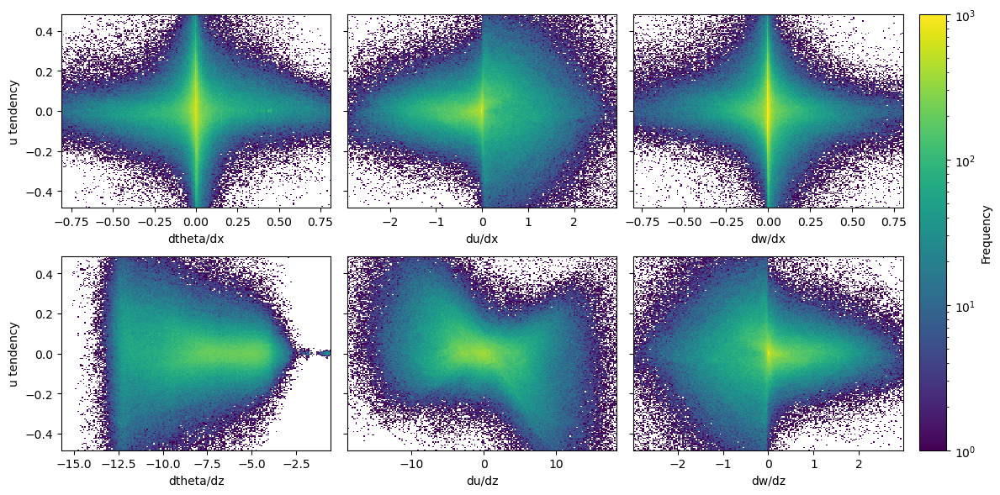

In [9]:
fig = plt.figure(figsize=(12, 6))
gs = mpl.gridspec.GridSpec(
    2, 4, height_ratios=[1, 1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

tend_var = 'u'
tend_data = param.sample(
    subgrid_tend[tend_var].compute(), x_sample, z_sample, 0, 0).ravel()
tend_lim = n_std*tend_data.std()

for i, coord in enumerate(['x', 'z']):
    for j, state_var in enumerate(coarse_t.data_vars):
        state_data = param.sample(
            coarse_t[state_var].differentiate(coord).compute(),
            x_sample, z_sample,
            1/2 if state_var == 'theta' else 0,
            -1/2 if state_var == 'theta' else 0,
        ).ravel()
        state_lim = n_std*state_data.std()
        state_mean = state_data.mean()

        ax = fig.add_subplot(gs[i,j])
        _, _, _, hist = ax.hist2d(
            state_data, tend_data, bins=[hist2d_nbins, hist2d_nbins],
            range=[
                [state_mean - state_lim, state_mean + state_lim],
                [-tend_lim, tend_lim],
            ],
            norm='log', vmin=1, vmax=1e3,
        )

        ax.set_xlabel(f'd{state_var}/d{coord}')
        if j == 0:
            ax.set_ylabel(f'{tend_var} tendency')
        else:
            ax.set_yticklabels([])

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()


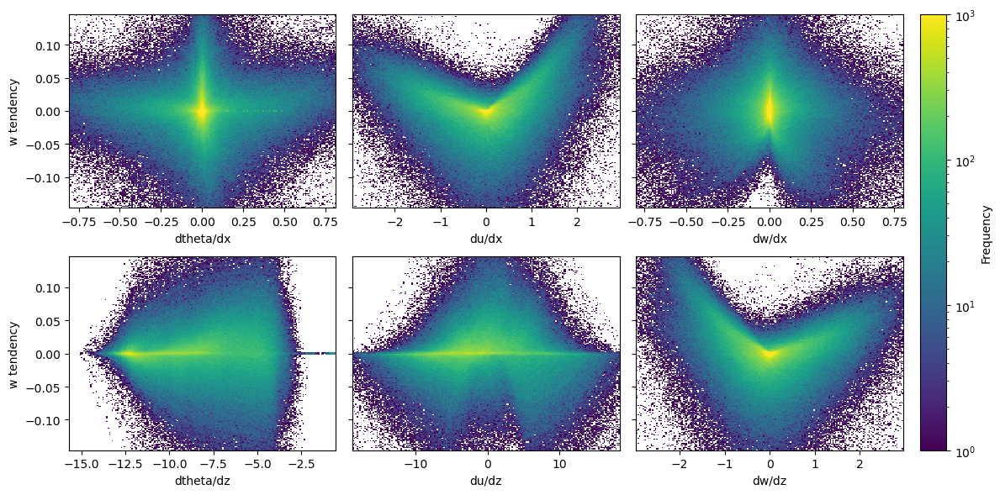

In [10]:
fig = plt.figure(figsize=(12, 6))
gs = mpl.gridspec.GridSpec(
    2, 4, height_ratios=[1, 1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

tend_var = 'w'
tend_data = param.sample(
    subgrid_tend[tend_var].compute(), x_sample, z_sample, 0, 0).ravel()
tend_lim = n_std*tend_data.std()

for i, coord in enumerate(['x', 'z']):
    for j, state_var in enumerate(coarse_t.data_vars):
        state_data = param.sample(
            coarse_t[state_var].differentiate(coord).compute(),
            x_sample, z_sample,
            1/2 if state_var == 'theta' else 0,
            -1/2 if state_var == 'theta' else 0,
        ).ravel()
        state_lim = n_std*state_data.std()
        state_mean = state_data.mean()

        ax = fig.add_subplot(gs[i,j])
        _, _, _, hist = ax.hist2d(
            state_data, tend_data, bins=[hist2d_nbins, hist2d_nbins],
            range=[
                [state_mean - state_lim, state_mean + state_lim],
                [-tend_lim, tend_lim],
            ],
            norm='log', vmin=1, vmax=1e3,
        )

        ax.set_xlabel(f'd{state_var}/d{coord}')
        if j == 0:
            ax.set_ylabel(f'{tend_var} tendency')
        else:
            ax.set_yticklabels([])

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()


### $0.95 \leq z \leq 1$

In [11]:
rng = np.random.default_rng(seed=0)
x_sample = rng.uniform(0, 8, 256*32)
z_sample = rng.uniform(0.95, 1, 256*32)


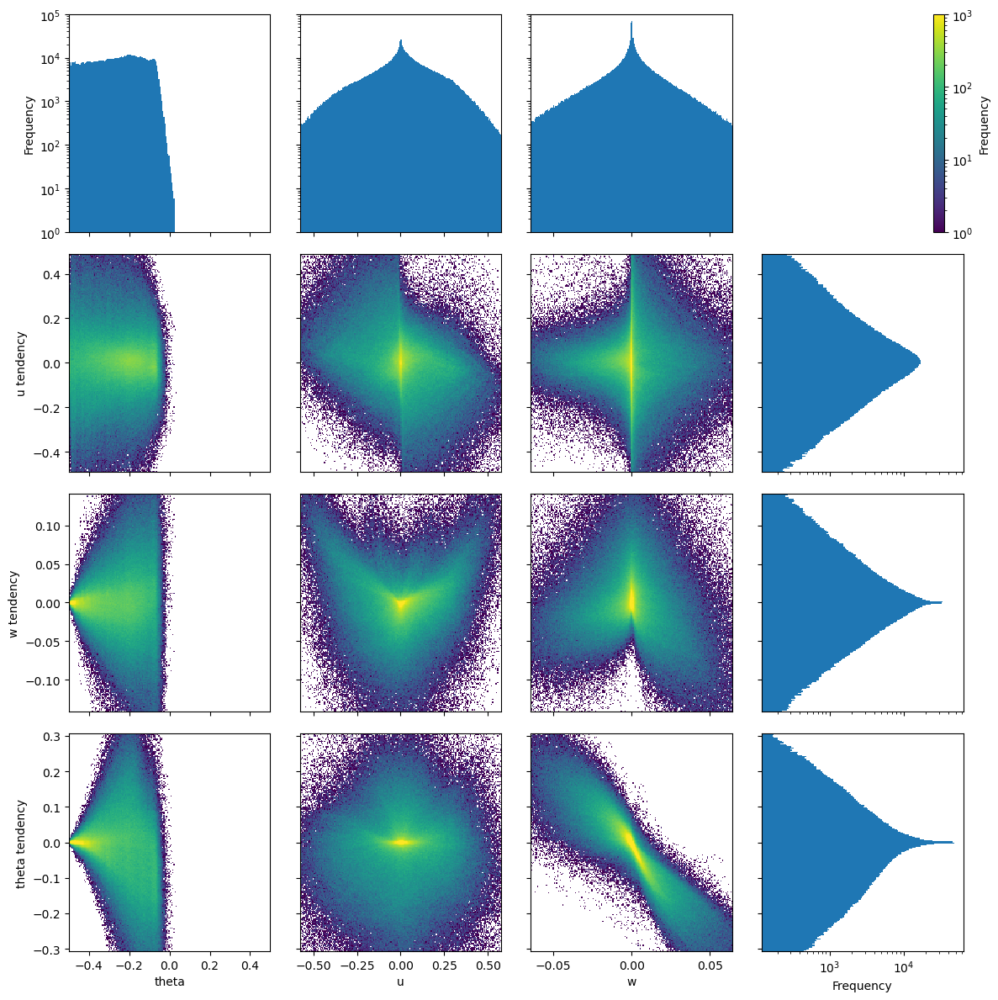

In [12]:
fig, axes = plt.subplots(4, 4, sharex='col', sharey='row', figsize=(12, 12))
hist1d_nbins = 200
hist2d_nbins = 200
n_std = 3

for i, tend_var in enumerate(subgrid_tend.data_vars):
    tend_data = param.sample(
        subgrid_tend[tend_var].compute(), x_sample, z_sample, 0, 0).ravel()
    tend_lim = n_std*tend_data.std()
    axes[i+1,0].set_ylabel(f'{tend_var} tendency')

    axes[i+1,3].hist(
        tend_data, bins=hist1d_nbins, orientation='horizontal',
        range=(-tend_lim, tend_lim), color='tab:blue',
        histtype='stepfilled', log=True
    )

    for j, state_var in enumerate(coarse_t.data_vars):
        state_data = param.sample(
            coarse_t[state_var].compute(), x_sample, z_sample,
            1/2 if state_var == 'theta' else 0,
            -1/2 if state_var == 'theta' else 0,
        ).ravel()
        if state_var == 'theta':
            state_lim = 0.5
        else:
            state_lim = n_std*state_data.std()

        _, _, _, hist = axes[i+1,j].hist2d(
            state_data, tend_data, bins=[hist2d_nbins, hist2d_nbins],
            range=[[-state_lim, state_lim], [-tend_lim, tend_lim]],
            norm='log', vmin=1, vmax=1e3
        )

        if i == 0:
            axes[0,j].hist(
                state_data, bins=hist1d_nbins,
                range=(-state_lim, state_lim), color='tab:blue',
                histtype='stepfilled', log=True
            )
            axes[0,j].set_ylim(1, 1e5)
            axes[-1,j].set_xlabel(state_var)

fig.colorbar(hist, ax=axes[0,-1], label='Frequency')
axes[0,0].set_ylabel('Frequency')
axes[-1,-1].set_xlabel('Frequency')
axes[0,3].remove()
fig.tight_layout()


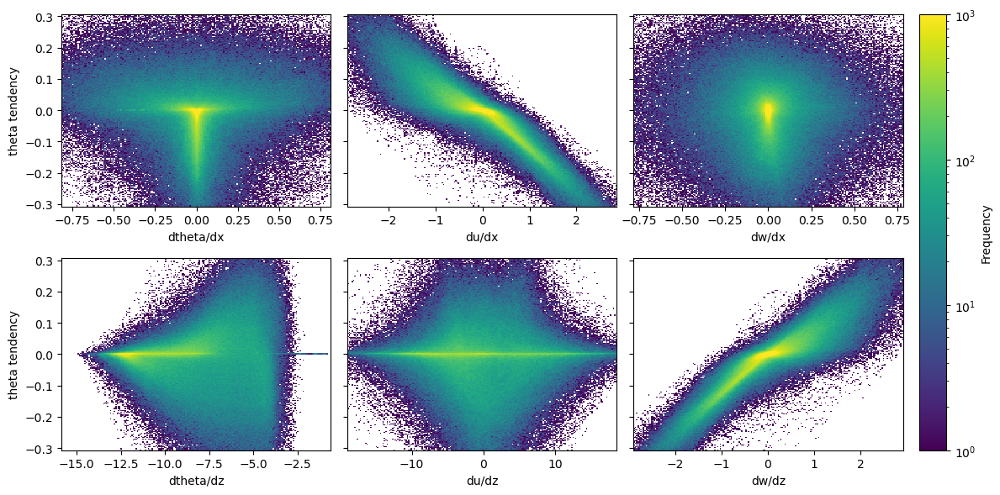

In [13]:
fig = plt.figure(figsize=(12, 6))
gs = mpl.gridspec.GridSpec(
    2, 4, height_ratios=[1, 1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

tend_var = 'theta'
tend_data = param.sample(
    subgrid_tend[tend_var].compute(), x_sample, z_sample, 0, 0).ravel()
tend_lim = n_std*tend_data.std()

for i, coord in enumerate(['x', 'z']):
    for j, state_var in enumerate(coarse_t.data_vars):
        state_data = param.sample(
            coarse_t[state_var].differentiate(coord).compute(),
            x_sample, z_sample,
            1/2 if state_var == 'theta' else 0,
            -1/2 if state_var == 'theta' else 0,
        ).ravel()
        state_lim = n_std*state_data.std()
        state_mean = state_data.mean()

        ax = fig.add_subplot(gs[i,j])
        _, _, _, hist = ax.hist2d(
            state_data, tend_data, bins=[hist2d_nbins, hist2d_nbins],
            range=[
                [state_mean - state_lim, state_mean + state_lim],
                [-tend_lim, tend_lim],
            ],
            norm='log', vmin=1, vmax=1e3,
        )

        ax.set_xlabel(f'd{state_var}/d{coord}')
        if j == 0:
            ax.set_ylabel(f'{tend_var} tendency')
        else:
            ax.set_yticklabels([])

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()


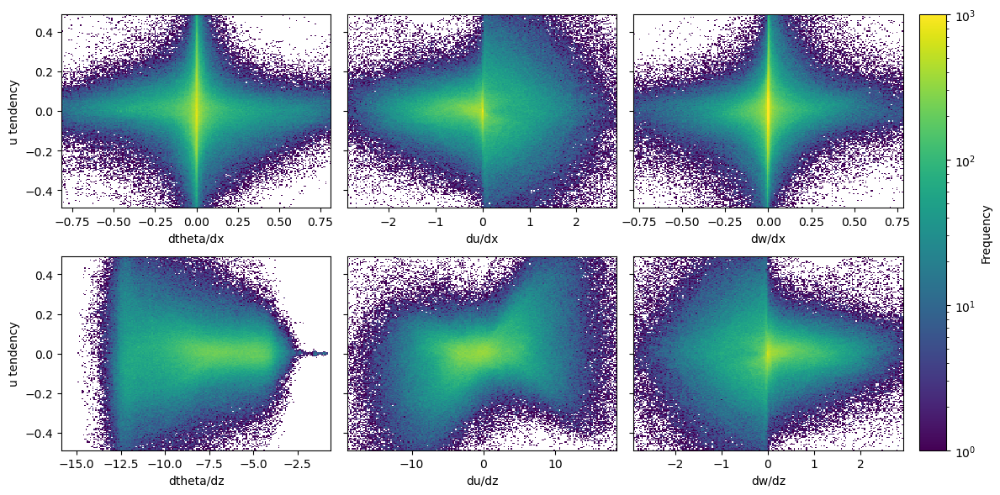

In [14]:
fig = plt.figure(figsize=(12, 6))
gs = mpl.gridspec.GridSpec(
    2, 4, height_ratios=[1, 1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

tend_var = 'u'
tend_data = param.sample(
    subgrid_tend[tend_var].compute(), x_sample, z_sample, 0, 0).ravel()
tend_lim = n_std*tend_data.std()

for i, coord in enumerate(['x', 'z']):
    for j, state_var in enumerate(coarse_t.data_vars):
        state_data = param.sample(
            coarse_t[state_var].differentiate(coord).compute(),
            x_sample, z_sample,
            1/2 if state_var == 'theta' else 0,
            -1/2 if state_var == 'theta' else 0,
        ).ravel()
        state_lim = n_std*state_data.std()
        state_mean = state_data.mean()

        ax = fig.add_subplot(gs[i,j])
        _, _, _, hist = ax.hist2d(
            state_data, tend_data, bins=[hist2d_nbins, hist2d_nbins],
            range=[
                [state_mean - state_lim, state_mean + state_lim],
                [-tend_lim, tend_lim],
            ],
            norm='log', vmin=1, vmax=1e3,
        )

        ax.set_xlabel(f'd{state_var}/d{coord}')
        if j == 0:
            ax.set_ylabel(f'{tend_var} tendency')
        else:
            ax.set_yticklabels([])

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()


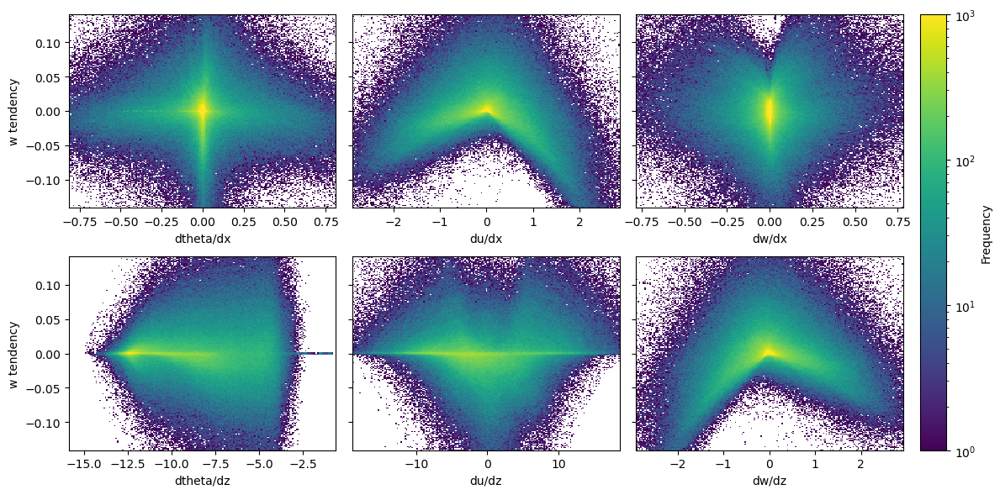

In [15]:
fig = plt.figure(figsize=(12, 6))
gs = mpl.gridspec.GridSpec(
    2, 4, height_ratios=[1, 1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

tend_var = 'w'
tend_data = param.sample(
    subgrid_tend[tend_var].compute(), x_sample, z_sample, 0, 0).ravel()
tend_lim = n_std*tend_data.std()

for i, coord in enumerate(['x', 'z']):
    for j, state_var in enumerate(coarse_t.data_vars):
        state_data = param.sample(
            coarse_t[state_var].differentiate(coord).compute(),
            x_sample, z_sample,
            1/2 if state_var == 'theta' else 0,
            -1/2 if state_var == 'theta' else 0,
        ).ravel()
        state_lim = n_std*state_data.std()
        state_mean = state_data.mean()

        ax = fig.add_subplot(gs[i,j])
        _, _, _, hist = ax.hist2d(
            state_data, tend_data, bins=[hist2d_nbins, hist2d_nbins],
            range=[
                [state_mean - state_lim, state_mean + state_lim],
                [-tend_lim, tend_lim],
            ],
            norm='log', vmin=1, vmax=1e3,
        )

        ax.set_xlabel(f'd{state_var}/d{coord}')
        if j == 0:
            ax.set_ylabel(f'{tend_var} tendency')
        else:
            ax.set_yticklabels([])

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()


### $0.25 \leq z \leq 0.75$

In [16]:
rng = np.random.default_rng(seed=0)
x_sample = rng.uniform(0, 8, 256*32)
z_sample = rng.uniform(0.25, 0.75, 256*32)


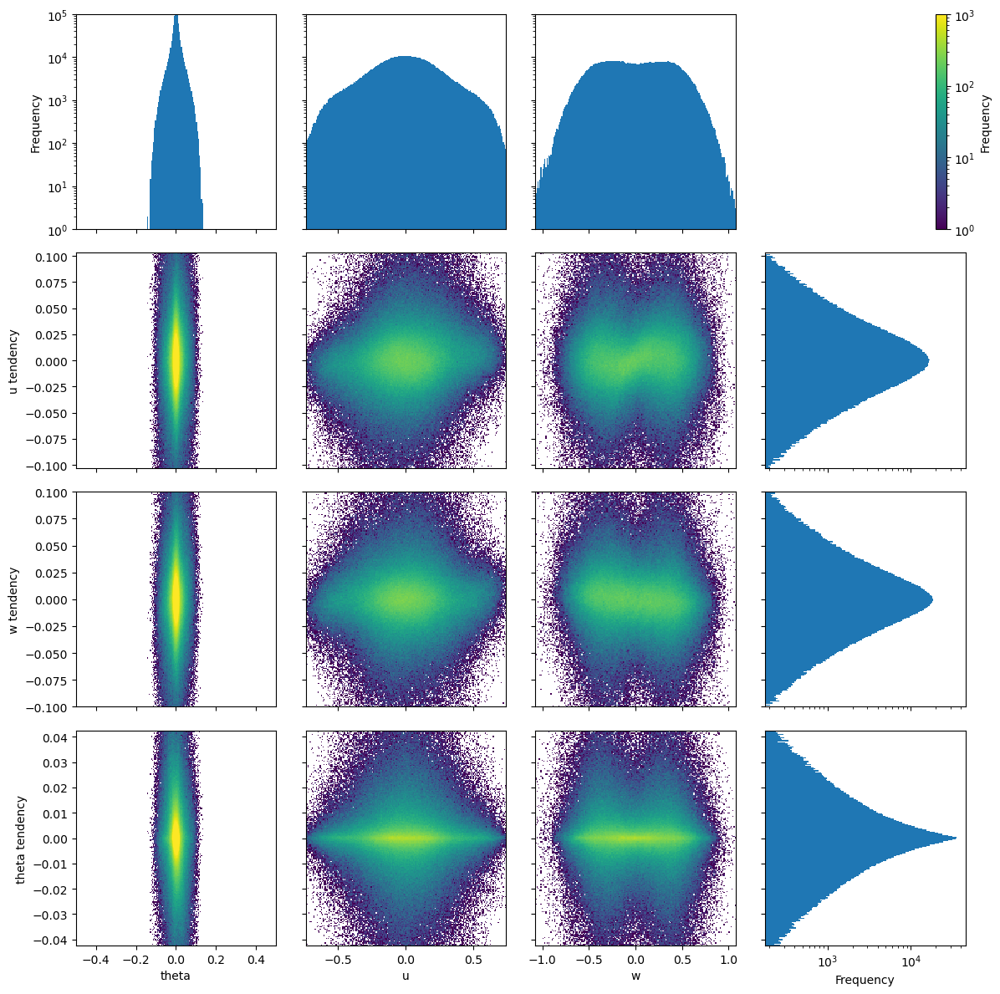

In [17]:
fig, axes = plt.subplots(4, 4, sharex='col', sharey='row', figsize=(12, 12))
hist1d_nbins = 200
hist2d_nbins = 200
n_std = 3

for i, tend_var in enumerate(subgrid_tend.data_vars):
    tend_data = param.sample(
        subgrid_tend[tend_var].compute(), x_sample, z_sample, 0, 0).ravel()
    tend_lim = n_std*tend_data.std()
    axes[i+1,0].set_ylabel(f'{tend_var} tendency')

    axes[i+1,3].hist(
        tend_data, bins=hist1d_nbins, orientation='horizontal',
        range=(-tend_lim, tend_lim), color='tab:blue',
        histtype='stepfilled', log=True
    )

    for j, state_var in enumerate(coarse_t.data_vars):
        state_data = param.sample(
            coarse_t[state_var].compute(), x_sample, z_sample,
            1/2 if state_var == 'theta' else 0,
            -1/2 if state_var == 'theta' else 0,
        ).ravel()
        if state_var == 'theta':
            state_lim = 0.5
        else:
            state_lim = n_std*state_data.std()

        _, _, _, hist = axes[i+1,j].hist2d(
            state_data, tend_data, bins=[hist2d_nbins, hist2d_nbins],
            range=[[-state_lim, state_lim], [-tend_lim, tend_lim]],
            norm='log', vmin=1, vmax=1e3
        )

        if i == 0:
            axes[0,j].hist(
                state_data, bins=hist1d_nbins,
                range=(-state_lim, state_lim), color='tab:blue',
                histtype='stepfilled', log=True
            )
            axes[0,j].set_ylim(1, 1e5)
            axes[-1,j].set_xlabel(state_var)

fig.colorbar(hist, ax=axes[0,-1], label='Frequency')
axes[0,0].set_ylabel('Frequency')
axes[-1,-1].set_xlabel('Frequency')
axes[0,3].remove()
fig.tight_layout()


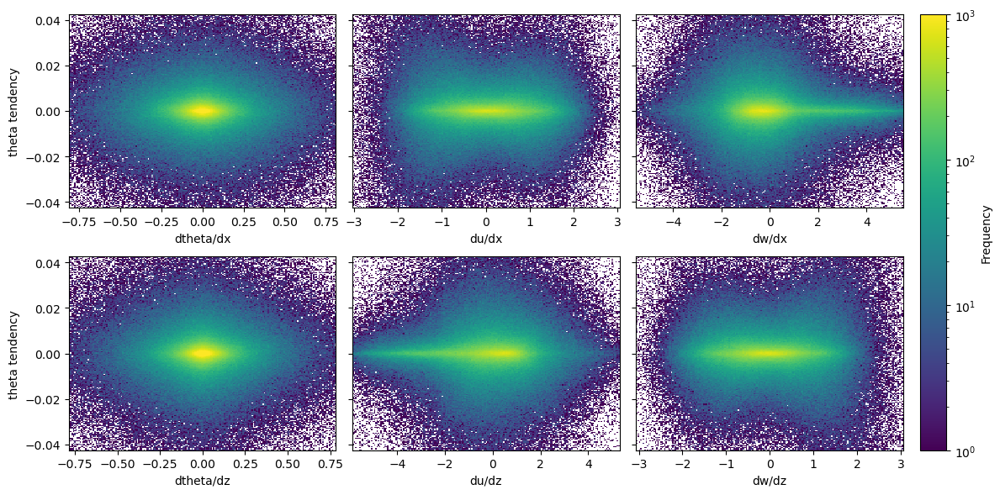

In [18]:
fig = plt.figure(figsize=(12, 6))
gs = mpl.gridspec.GridSpec(
    2, 4, height_ratios=[1, 1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

tend_var = 'theta'
tend_data = param.sample(
    subgrid_tend[tend_var].compute(), x_sample, z_sample, 0, 0).ravel()
tend_lim = n_std*tend_data.std()

for i, coord in enumerate(['x', 'z']):
    for j, state_var in enumerate(coarse_t.data_vars):
        state_data = param.sample(
            coarse_t[state_var].differentiate(coord).compute(),
            x_sample, z_sample,
            1/2 if state_var == 'theta' else 0,
            -1/2 if state_var == 'theta' else 0,
        ).ravel()
        state_lim = n_std*state_data.std()
        state_mean = state_data.mean()

        ax = fig.add_subplot(gs[i,j])
        _, _, _, hist = ax.hist2d(
            state_data, tend_data, bins=[hist2d_nbins, hist2d_nbins],
            range=[
                [state_mean - state_lim, state_mean + state_lim],
                [-tend_lim, tend_lim],
            ],
            norm='log', vmin=1, vmax=1e3,
        )

        ax.set_xlabel(f'd{state_var}/d{coord}')
        if j == 0:
            ax.set_ylabel(f'{tend_var} tendency')
        else:
            ax.set_yticklabels([])

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()


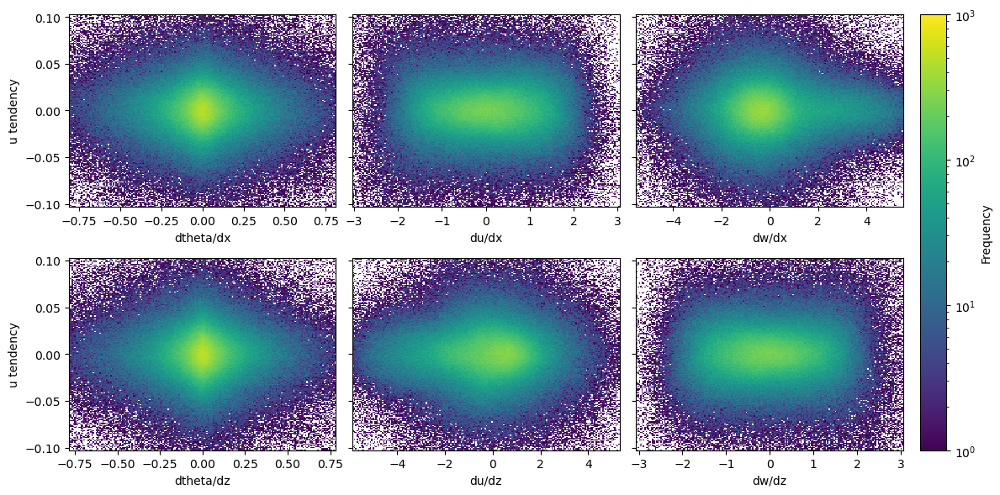

In [19]:
fig = plt.figure(figsize=(12, 6))
gs = mpl.gridspec.GridSpec(
    2, 4, height_ratios=[1, 1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

tend_var = 'u'
tend_data = param.sample(
    subgrid_tend[tend_var].compute(), x_sample, z_sample, 0, 0).ravel()
tend_lim = n_std*tend_data.std()

for i, coord in enumerate(['x', 'z']):
    for j, state_var in enumerate(coarse_t.data_vars):
        state_data = param.sample(
            coarse_t[state_var].differentiate(coord).compute(),
            x_sample, z_sample,
            1/2 if state_var == 'theta' else 0,
            -1/2 if state_var == 'theta' else 0,
        ).ravel()
        state_lim = n_std*state_data.std()
        state_mean = state_data.mean()

        ax = fig.add_subplot(gs[i,j])
        _, _, _, hist = ax.hist2d(
            state_data, tend_data, bins=[hist2d_nbins, hist2d_nbins],
            range=[
                [state_mean - state_lim, state_mean + state_lim],
                [-tend_lim, tend_lim],
            ],
            norm='log', vmin=1, vmax=1e3,
        )

        ax.set_xlabel(f'd{state_var}/d{coord}')
        if j == 0:
            ax.set_ylabel(f'{tend_var} tendency')
        else:
            ax.set_yticklabels([])

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()


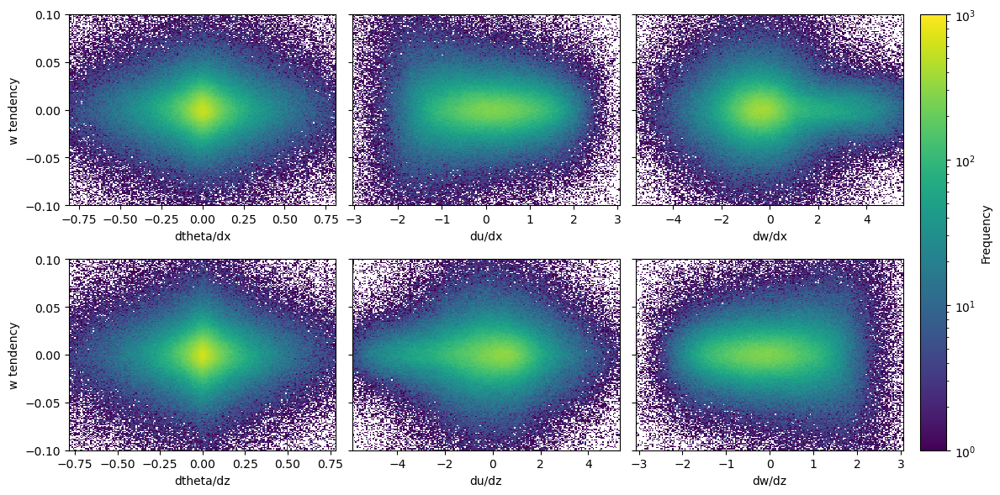

In [20]:
fig = plt.figure(figsize=(12, 6))
gs = mpl.gridspec.GridSpec(
    2, 4, height_ratios=[1, 1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

tend_var = 'w'
tend_data = param.sample(
    subgrid_tend[tend_var].compute(), x_sample, z_sample, 0, 0).ravel()
tend_lim = n_std*tend_data.std()

for i, coord in enumerate(['x', 'z']):
    for j, state_var in enumerate(coarse_t.data_vars):
        state_data = param.sample(
            coarse_t[state_var].differentiate(coord).compute(),
            x_sample, z_sample,
            1/2 if state_var == 'theta' else 0,
            -1/2 if state_var == 'theta' else 0,
        ).ravel()
        state_lim = n_std*state_data.std()
        state_mean = state_data.mean()

        ax = fig.add_subplot(gs[i,j])
        _, _, _, hist = ax.hist2d(
            state_data, tend_data, bins=[hist2d_nbins, hist2d_nbins],
            range=[
                [state_mean - state_lim, state_mean + state_lim],
                [-tend_lim, tend_lim],
            ],
            norm='log', vmin=1, vmax=1e3,
        )

        ax.set_xlabel(f'd{state_var}/d{coord}')
        if j == 0:
            ax.set_ylabel(f'{tend_var} tendency')
        else:
            ax.set_yticklabels([])

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()


### Observations
- Strong negative correlation between $w$ and $\theta$ tendency in both boundary layers
- Strong correlation between $du/dx = -dw/dz$ and $\theta$ tendency in boundary layers, but sign is different between bottom and top

### z-dependence

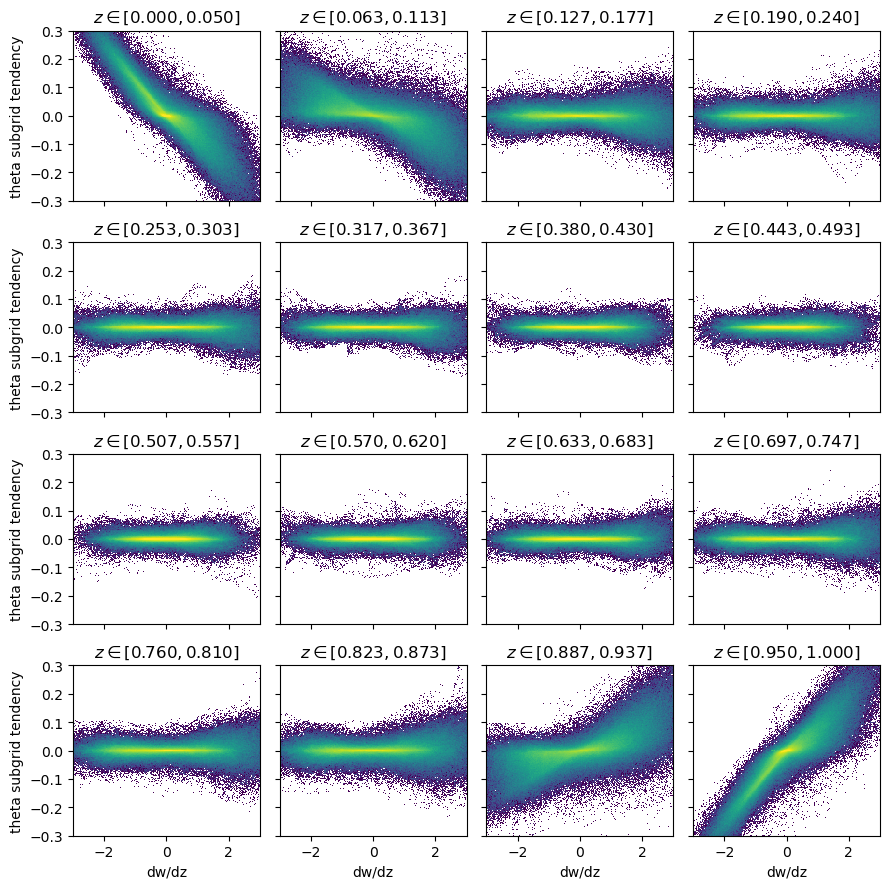

In [21]:
rng = np.random.default_rng(seed=0)
n_rows, n_cols = 4, 4
z_slices = np.linspace(0.025, 0.975, n_rows*n_cols)
z_tol = 0.025

fig, axes = plt.subplots(
    n_rows, n_cols, figsize=(9, 9), sharex=True, sharey=True)
for i, ax in enumerate(axes.ravel()):
    x_sample = rng.uniform(0, 8, 256*32)
    z_min = z_slices[i] - z_tol
    z_max = z_slices[i] + z_tol
    z_sample = rng.uniform(z_min, z_max, 256*32)

    tend_data = param.sample(
        subgrid_tend.theta.compute(), x_sample, z_sample, 0, 0).ravel()
    state_data = param.sample(
        coarse_t.w.differentiate('z').compute(),
        x_sample, z_sample, 1/2, -1/2,
    ).ravel()

    ax.hist2d(
        state_data, tend_data, bins=[200, 200],
        range=[[-3, 3], [-0.3, 0.3]],
        norm='log', vmin=1, vmax=2e3,
    )
    ax.set(title=f'$z \\in [{z_min:.3f}, {z_max:.3f}]$')

for i in range(n_rows):
    axes[i,0].set_ylabel('theta subgrid tendency')
for i in range(n_cols):
    axes[-1,i].set_xlabel('dw/dz')

fig.tight_layout()


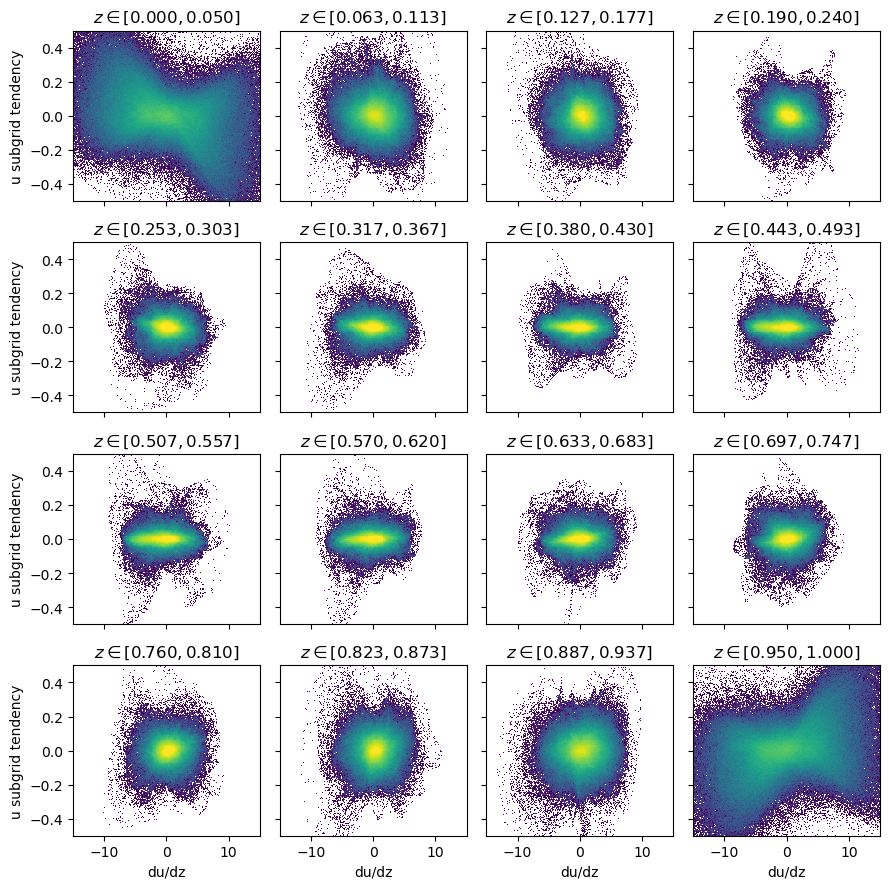

In [22]:
rng = np.random.default_rng(seed=0)
n_rows, n_cols = 4, 4
z_slices = np.linspace(0.025, 0.975, n_rows*n_cols)
z_tol = 0.025

fig, axes = plt.subplots(
    n_rows, n_cols, figsize=(9, 9), sharex=True, sharey=True)
for i, ax in enumerate(axes.ravel()):
    x_sample = rng.uniform(0, 8, 256*32)
    z_min = z_slices[i] - z_tol
    z_max = z_slices[i] + z_tol
    z_sample = rng.uniform(z_min, z_max, 256*32)

    tend_data = param.sample(
        subgrid_tend.u.compute(), x_sample, z_sample, 0, 0).ravel()
    state_data = param.sample(
        coarse_t.u.differentiate('z').compute(),
        x_sample, z_sample, 0, 0,
    ).ravel()

    ax.hist2d(
        state_data, tend_data, bins=[200, 200],
        range=[[-15, 15], [-0.5, 0.5]],
        norm='log', vmin=1, vmax=2e3,
    )
    ax.set(title=f'$z \\in [{z_min:.3f}, {z_max:.3f}]$')

for i in range(n_rows):
    axes[i,0].set_ylabel('u subgrid tendency')
for i in range(n_cols):
    axes[-1,i].set_xlabel('du/dz')

fig.tight_layout()


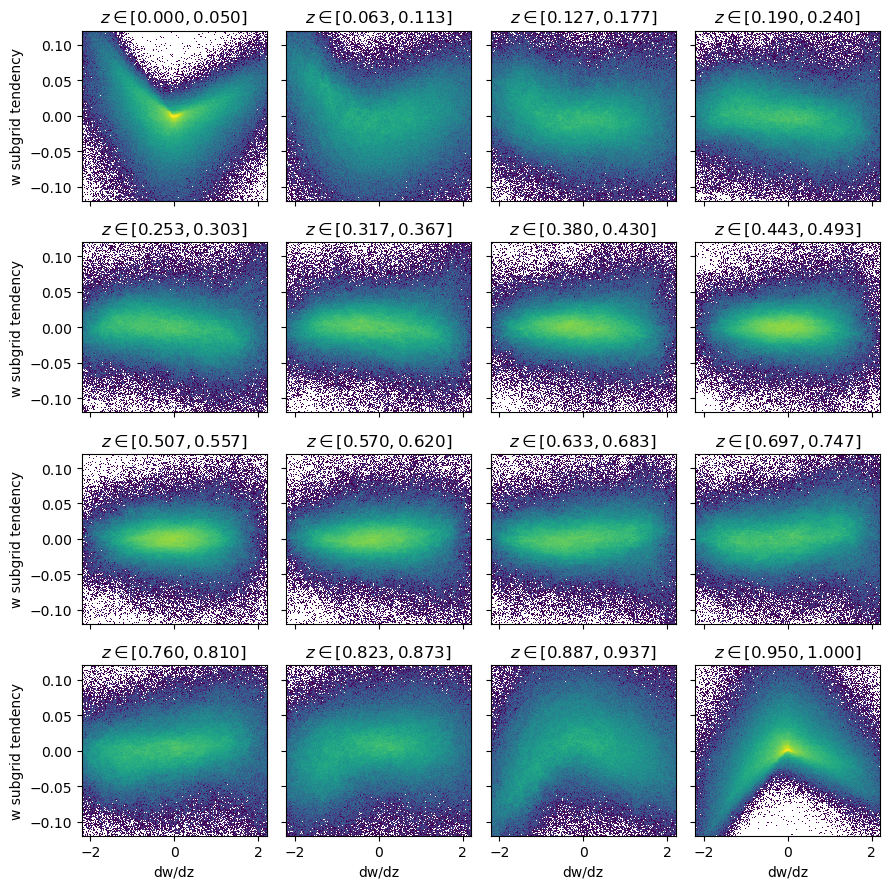

In [23]:
rng = np.random.default_rng(seed=0)
n_rows, n_cols = 4, 4
z_slices = np.linspace(0.025, 0.975, n_rows*n_cols)
z_tol = 0.025

fig, axes = plt.subplots(
    n_rows, n_cols, figsize=(9, 9), sharex=True, sharey=True)
for i, ax in enumerate(axes.ravel()):
    x_sample = rng.uniform(0, 8, 256*32)
    z_min = z_slices[i] - z_tol
    z_max = z_slices[i] + z_tol
    z_sample = rng.uniform(z_min, z_max, 256*32)

    tend_data = param.sample(
        subgrid_tend.w.compute(), x_sample, z_sample, 0, 0).ravel()
    state_data = param.sample(
        coarse_t.w.differentiate('z').compute(),
        x_sample, z_sample, 0, 0,
    ).ravel()

    ax.hist2d(
        state_data, tend_data, bins=[200, 200],
        range=[[-2.2, 2.2], [-0.12, 0.12]],
        norm='log', vmin=1, vmax=1e3,
    )
    ax.set(title=f'$z \\in [{z_min:.3f}, {z_max:.3f}]$')

for i in range(n_rows):
    axes[i,0].set_ylabel('w subgrid tendency')
for i in range(n_cols):
    axes[-1,i].set_xlabel('dw/dz')

fig.tight_layout()


## Subgrid tendency vs. resolved tendency

### Whole domain

In [24]:
rng = np.random.default_rng(seed=0)
x_sample = rng.uniform(0, 8, 256*32)
z_sample = rng.uniform(0, 1, 256*32)


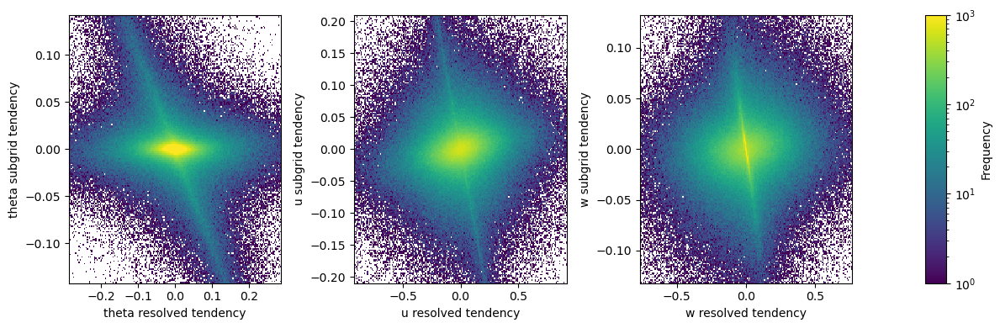

In [25]:
fig = plt.figure(figsize=(12, 4))
gs = mpl.gridspec.GridSpec(
    1, 4, height_ratios=[1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

for i, var in enumerate(coarse_t.data_vars):
    sub_tend_data = param.sample(
        subgrid_tend[var].compute(), x_sample, z_sample, 0, 0).ravel()
    sub_tend_lim = n_std*sub_tend_data.std()

    res_tend_data = param.sample(
        coarse_tend[var].compute(), x_sample, z_sample, 0, 0).ravel()
    res_tend_lim = n_std*res_tend_data.std()

    ax = fig.add_subplot(gs[i])
    _, _, _, hist = ax.hist2d(
        res_tend_data, sub_tend_data, bins=[hist2d_nbins, hist2d_nbins],
        range=[
            [-res_tend_lim, res_tend_lim],
            [-sub_tend_lim, sub_tend_lim],
        ],
        norm='log', vmin=1, vmax=1e3,
    )

    ax.set(xlabel=f'{var} resolved tendency', ylabel=f'{var} subgrid tendency')

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()


### $0 \leq z \leq 0.05$ or $0.95 \leq z \leq 1$

In [26]:
rng = np.random.default_rng(seed=0)
x_sample = rng.uniform(0, 8, 256*32)
z_sample = np.concatenate([
    rng.uniform(0, 0.05, 256*32//2), rng.uniform(0.95, 1, 256*32//2)
])


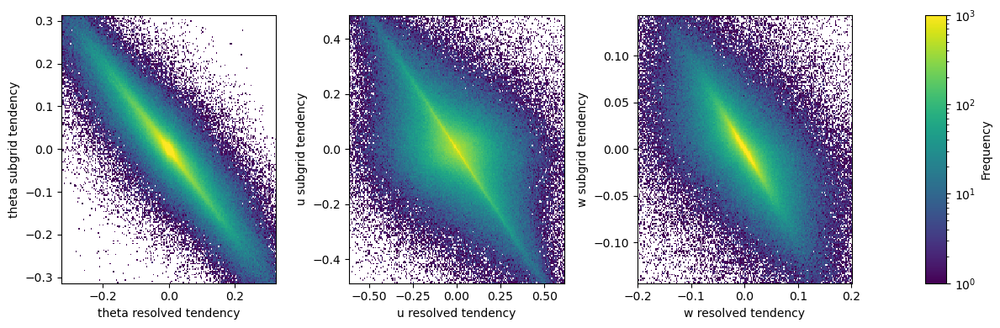

In [27]:
fig = plt.figure(figsize=(12, 4))
gs = mpl.gridspec.GridSpec(
    1, 4, height_ratios=[1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

for i, var in enumerate(coarse_t.data_vars):
    sub_tend_data = param.sample(
        subgrid_tend[var].compute(), x_sample, z_sample, 0, 0).ravel()
    sub_tend_lim = n_std*sub_tend_data.std()

    res_tend_data = param.sample(
        coarse_tend[var].compute(), x_sample, z_sample, 0, 0).ravel()
    res_tend_lim = n_std*res_tend_data.std()

    ax = fig.add_subplot(gs[i])
    _, _, _, hist = ax.hist2d(
        res_tend_data, sub_tend_data, bins=[hist2d_nbins, hist2d_nbins],
        range=[
            [-res_tend_lim, res_tend_lim],
            [-sub_tend_lim, sub_tend_lim],
        ],
        norm='log', vmin=1, vmax=1e3,
    )

    ax.set(xlabel=f'{var} resolved tendency', ylabel=f'{var} subgrid tendency')

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()


### $0.25 \leq z \leq 0.75$

In [28]:
rng = np.random.default_rng(seed=0)
x_sample = rng.uniform(0, 8, 256*32)
z_sample = rng.uniform(0.25, 0.75, 256*32)


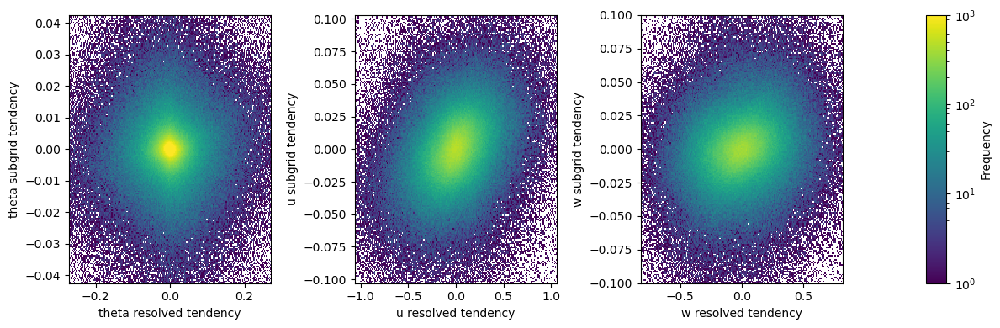

In [29]:
fig = plt.figure(figsize=(12, 4))
gs = mpl.gridspec.GridSpec(
    1, 4, height_ratios=[1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

for i, var in enumerate(coarse_t.data_vars):
    sub_tend_data = param.sample(
        subgrid_tend[var].compute(), x_sample, z_sample, 0, 0).ravel()
    sub_tend_lim = n_std*sub_tend_data.std()

    res_tend_data = param.sample(
        coarse_tend[var].compute(), x_sample, z_sample, 0, 0).ravel()
    res_tend_lim = n_std*res_tend_data.std()

    ax = fig.add_subplot(gs[i])
    _, _, _, hist = ax.hist2d(
        res_tend_data, sub_tend_data, bins=[hist2d_nbins, hist2d_nbins],
        range=[
            [-res_tend_lim, res_tend_lim],
            [-sub_tend_lim, sub_tend_lim],
        ],
        norm='log', vmin=1, vmax=1e3,
    )

    ax.set(xlabel=f'{var} resolved tendency', ylabel=f'{var} subgrid tendency')

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()


### z-dependence

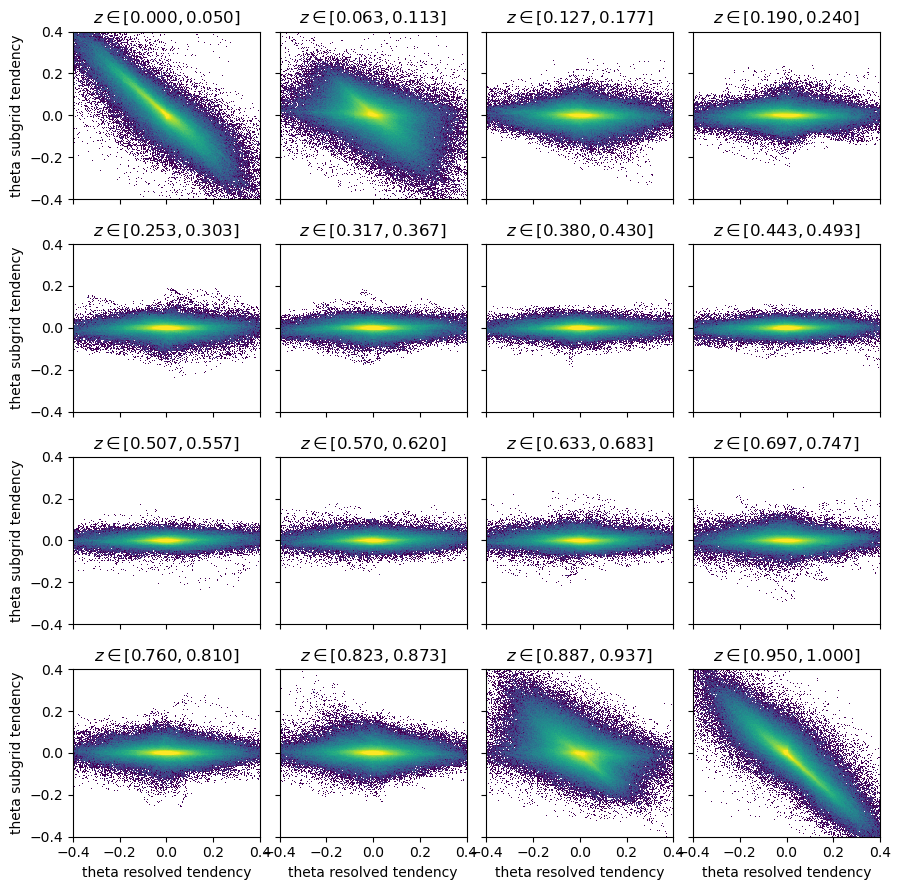

In [30]:
rng = np.random.default_rng(seed=0)
n_rows, n_cols = 4, 4
z_slices = np.linspace(0.025, 0.975, n_rows*n_cols)
z_tol = 0.025

fig, axes = plt.subplots(
    n_rows, n_cols, figsize=(9, 9), sharex=True, sharey=True)
for i, ax in enumerate(axes.ravel()):
    x_sample = rng.uniform(0, 8, 256*32)
    z_min = z_slices[i] - z_tol
    z_max = z_slices[i] + z_tol
    z_sample = rng.uniform(z_min, z_max, 256*32)

    sub_tend_data = param.sample(
        subgrid_tend.theta.compute(), x_sample, z_sample, 0, 0).ravel()
    res_tend_data = param.sample(
        coarse_tend.theta.compute(), x_sample, z_sample, 0, 0).ravel()

    ax.hist2d(
        res_tend_data, sub_tend_data, bins=[200, 200],
        range=[[-0.4, 0.4], [-0.4, 0.4]],
        norm='log', vmin=1, vmax=2e3,
    )
    ax.set(title=f'$z \\in [{z_min:.3f}, {z_max:.3f}]$')

for i in range(n_rows):
    axes[i,0].set_ylabel('theta subgrid tendency')
for i in range(n_cols):
    axes[-1,i].set_xlabel('theta resolved tendency')

fig.tight_layout()


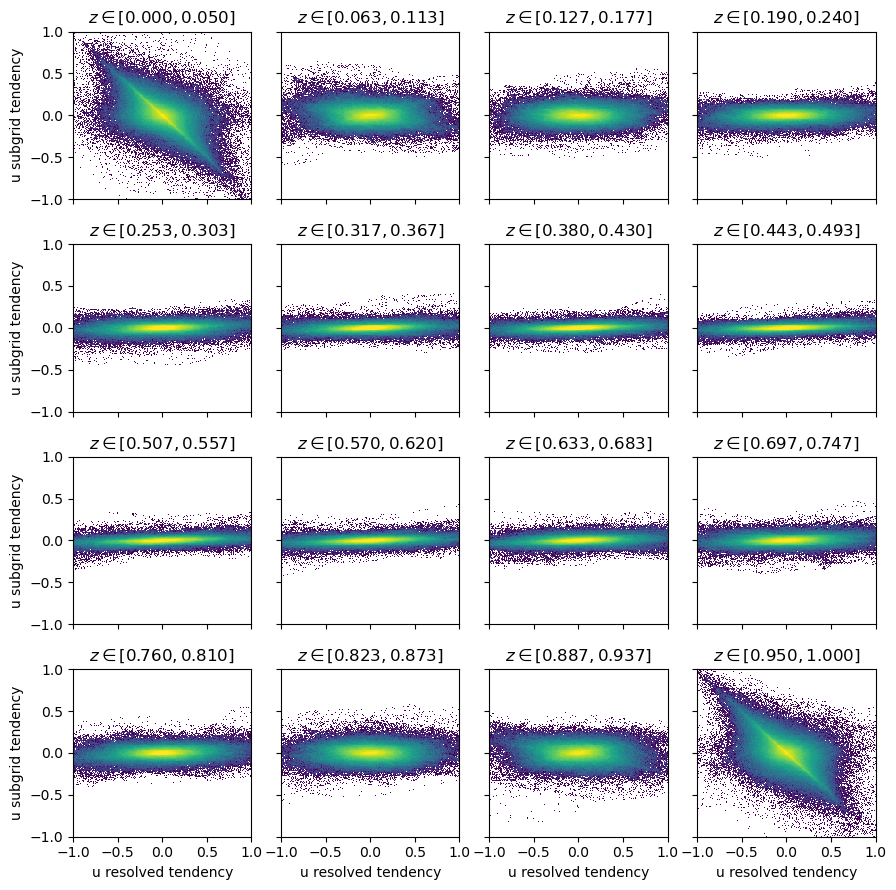

In [31]:
rng = np.random.default_rng(seed=0)
n_rows, n_cols = 4, 4
z_slices = np.linspace(0.025, 0.975, n_rows*n_cols)
z_tol = 0.025

fig, axes = plt.subplots(
    n_rows, n_cols, figsize=(9, 9), sharex=True, sharey=True)
for i, ax in enumerate(axes.ravel()):
    x_sample = rng.uniform(0, 8, 256*32)
    z_min = z_slices[i] - z_tol
    z_max = z_slices[i] + z_tol
    z_sample = rng.uniform(z_min, z_max, 256*32)

    sub_tend_data = param.sample(
        subgrid_tend.u.compute(), x_sample, z_sample, 0, 0).ravel()
    res_tend_data = param.sample(
        coarse_tend.u.compute(), x_sample, z_sample, 0, 0).ravel()

    ax.hist2d(
        res_tend_data, sub_tend_data, bins=[200, 200],
        range=[[-1, 1], [-1, 1]],
        norm='log', vmin=1, vmax=2e3,
    )
    ax.set(title=f'$z \\in [{z_min:.3f}, {z_max:.3f}]$')

for i in range(n_rows):
    axes[i,0].set_ylabel('u subgrid tendency')
for i in range(n_cols):
    axes[-1,i].set_xlabel('u resolved tendency')

fig.tight_layout()


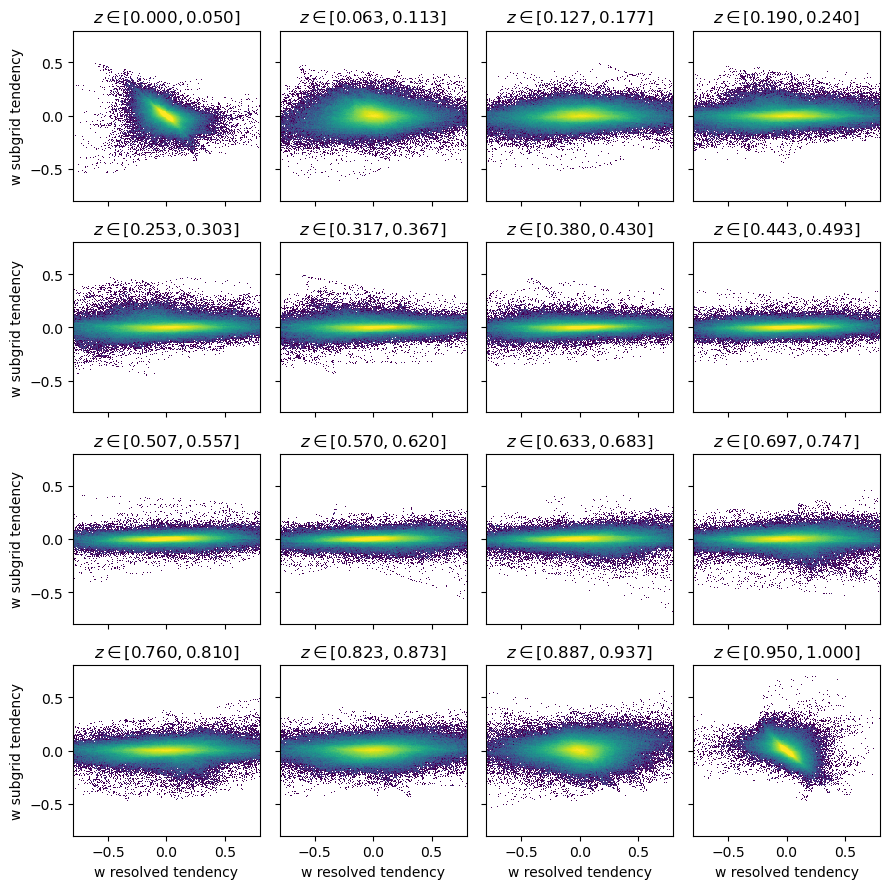

In [32]:
rng = np.random.default_rng(seed=0)
n_rows, n_cols = 4, 4
z_slices = np.linspace(0.025, 0.975, n_rows*n_cols)
z_tol = 0.025

fig, axes = plt.subplots(
    n_rows, n_cols, figsize=(9, 9), sharex=True, sharey=True)
for i, ax in enumerate(axes.ravel()):
    x_sample = rng.uniform(0, 8, 256*32)
    z_min = z_slices[i] - z_tol
    z_max = z_slices[i] + z_tol
    z_sample = rng.uniform(z_min, z_max, 256*32)

    sub_tend_data = param.sample(
        subgrid_tend.w.compute(), x_sample, z_sample, 0, 0).ravel()
    res_tend_data = param.sample(
        coarse_tend.w.compute(), x_sample, z_sample, 0, 0).ravel()

    ax.hist2d(
        res_tend_data, sub_tend_data, bins=[200, 200],
        range=[[-0.8, 0.8], [-0.8, 0.8]],
        norm='log', vmin=1, vmax=2e3,
    )
    ax.set(title=f'$z \\in [{z_min:.3f}, {z_max:.3f}]$')

for i in range(n_rows):
    axes[i,0].set_ylabel('w subgrid tendency')
for i in range(n_cols):
    axes[-1,i].set_xlabel('w resolved tendency')

fig.tight_layout()


## Richardson number
$$
    \mathrm{Ri} = \frac{\partial \theta / \partial z}{(\partial u / \partial z)^2}
$$

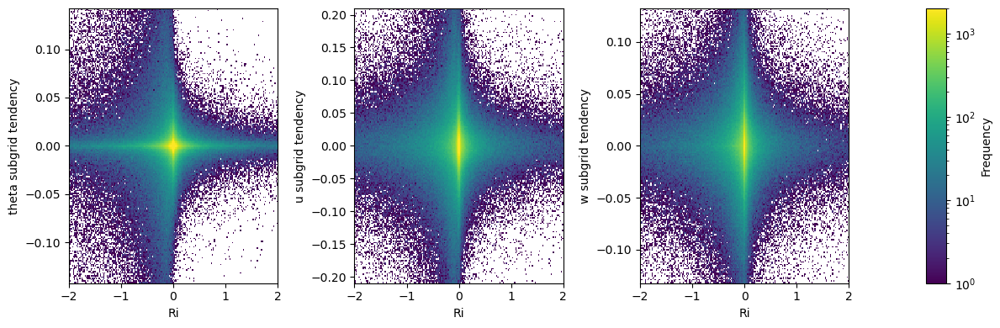

In [33]:
rng = np.random.default_rng(seed=0)
x_sample = rng.uniform(0, 8, 256*32)
z_sample = rng.uniform(0, 1, 256*32)

fig = plt.figure(figsize=(12, 4))
gs = mpl.gridspec.GridSpec(
    1, 4, height_ratios=[1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

richardson = (
    coarse_t.theta.differentiate('z')
    / (coarse_t.u.differentiate('z'))**2
)
richardson = param.sample(
    richardson.compute(), x_sample, z_sample, None, None).ravel()

for i, var in enumerate(coarse_t.data_vars):
    tend_data = param.sample(
        subgrid_tend[var].compute(), x_sample, z_sample, 0, 0).ravel()
    tend_lim = n_std*tend_data.std()

    ax = fig.add_subplot(gs[i])
    _, _, _, hist = ax.hist2d(
        richardson, tend_data, bins=[hist2d_nbins, hist2d_nbins],
        range=[[-2, 2], [-tend_lim, tend_lim]],
        norm='log', vmin=1, vmax=2e3,
    )

    ax.set(xlabel='Ri', ylabel=f'{var} subgrid tendency')

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()


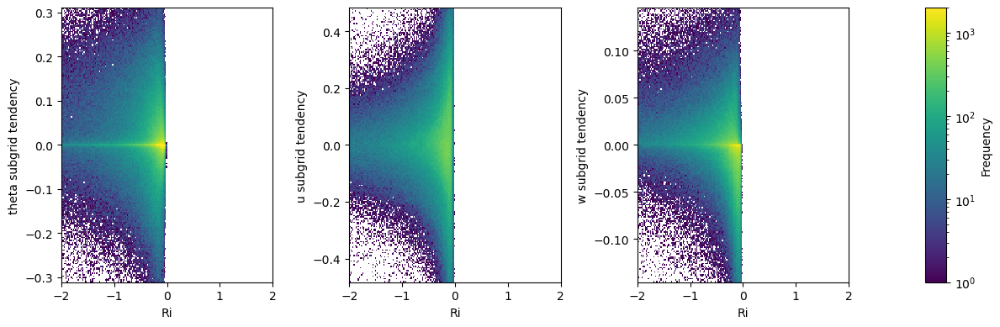

In [34]:
rng = np.random.default_rng(seed=0)
x_sample = rng.uniform(0, 8, 256*32)
z_sample = rng.uniform(0, 0.05, 256*32)

fig = plt.figure(figsize=(12, 4))
gs = mpl.gridspec.GridSpec(
    1, 4, height_ratios=[1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

richardson = (
    coarse_t.theta.differentiate('z')
    / (coarse_t.u.differentiate('z'))**2
)
richardson = param.sample(
    richardson.compute(), x_sample, z_sample, None, None).ravel()

for i, var in enumerate(coarse_t.data_vars):
    tend_data = param.sample(
        subgrid_tend[var].compute(), x_sample, z_sample, 0, 0).ravel()
    tend_lim = n_std*tend_data.std()

    ax = fig.add_subplot(gs[i])
    _, _, _, hist = ax.hist2d(
        richardson, tend_data, bins=[hist2d_nbins, hist2d_nbins],
        range=[[-2, 2], [-tend_lim, tend_lim]],
        norm='log', vmin=1, vmax=2e3,
    )

    ax.set(xlabel='Ri', ylabel=f'{var} subgrid tendency')

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()


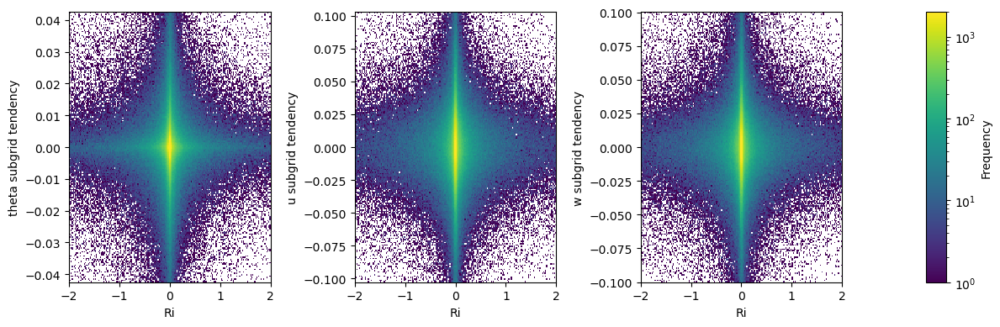

In [35]:
rng = np.random.default_rng(seed=0)
x_sample = rng.uniform(0, 8, 256*32)
z_sample = rng.uniform(0.25, 0.75, 256*32)

fig = plt.figure(figsize=(12, 4))
gs = mpl.gridspec.GridSpec(
    1, 4, height_ratios=[1], width_ratios=[1, 1, 1, 0.1])
hist2d_nbins = 200
n_std = 3

richardson = (
    coarse_t.theta.differentiate('z')
    / (coarse_t.u.differentiate('z'))**2
)
richardson = param.sample(
    richardson.compute(), x_sample, z_sample, None, None).ravel()

for i, var in enumerate(coarse_t.data_vars):
    tend_data = param.sample(
        subgrid_tend[var].compute(), x_sample, z_sample, 0, 0).ravel()
    tend_lim = n_std*tend_data.std()

    ax = fig.add_subplot(gs[i])
    _, _, _, hist = ax.hist2d(
        richardson, tend_data, bins=[hist2d_nbins, hist2d_nbins],
        range=[[-2, 2], [-tend_lim, tend_lim]],
        norm='log', vmin=1, vmax=2e3,
    )

    ax.set(xlabel='Ri', ylabel=f'{var} subgrid tendency')

ax = fig.add_subplot(gs[:,-1])
fig.colorbar(hist, cax=ax, label='Frequency')
fig.tight_layout()
